# Accessibility of grocers by bike
Author:  Iiro Seppä

# Main Idea
- Fetch OSM data for a place identified by name in places.csv
- calculate the accessibility of the nearest grocer by bike

In [28]:
import osmnx
import networkx
import pandas as pd
import geopandas as geopd
import matplotlib.pyplot as plt
import contextily as cx
import numpy as np
import os
import random
import shapely
import rasterio

from time import perf_counter

from scipy.spatial import KDTree
from scipy.interpolate import griddata

from geopy.geocoders import Nominatim

from shapely.geometry import Point 
from shapely.geometry import LineString

# There are some deprecation warnings in the environment, this skips those
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')


# Options

In [29]:
# The default dpi and canvs size is quite low for plt, this fixes that
plt.rcParams['figure.dpi'] = 500

plt.rcParams['figure.figsize'] = [10, 10]

# The radius of the wanted area
buffer_size = 1000

# To ensure accurate results at the borders,the data is fetched from a larger area than is actually necessary  
overbuffering = 600

buffer_size += overbuffering

#Size of the route search grid 
grid_spacing = 30

# how many closest (euclidean) locations are checked trough the networking
k_closest = 3

""" Walking speed is used to reach the grid, m/s.
Based on Raymond et al. Effects of obesity and sex on the energetic cost and preferred speed of walking https://doi.org/10.1152/japplphysiol.00767.2005
The original value for comfortable walking speed is 1.42 m/s (5,1km/h),
which has been reduced to 1 m/s (3,6 km/h) because the bike is assumed to be walked,
possibly on rough terrain and not in a straight line
"""
walking_speed = 1

""" Biking speed, m/s 
According to https://web.archive.org/web/20131212093813/http://subsite.kk.dk/sitecore/content/Subsites/CityOfCopenhagen/SubsiteFrontpage/LivingInCopenhagen/CityAndTraffic/CityOfCyclists/CycleStatistics.aspx
The average biking speed is 4,3 m/s (15,5 km/h)in Copenhagen,when there are traffic lights
and 5,7 (20,7 km/h) when the lights are set favorably to cyclists
Due to less traffic lights away from the centre, a constant speed of 5 m/s  (18 km/h) is assumed to everywhere for simplicity.
Hilliness is not taken into account at all for simplicity, so the estimated speed is a bit too high .
"""
biking_speed = 5


#  3= square, round buffers are not yet implemented so this should not be changed
buffer_style = 3

# In case sea areas should be included, this path should be provided. National land surveys still water areas are expected. 
# This is optional and can be skipped by setting it to None
sea_path = "/home/iiro/Documents/GIS/Maanmittauslaitoksen data/mml/maastotietokanta/2023/gpkg/MTK-vakavesi_23-03-02.gpkg"

# The wanted cities are written in a accompanying cities.csv, where name of each city is written on it's own row
- This allows for easy expandability

In [30]:
""" The bounding boxes of the cities are generated from a list of city names in a csv.
"""
cities = pd.read_csv("places.csv")

cities

,name
0,Helsinki


# Geolocating the cities with Nominatim and creating a buffer around the city centre, where the data is fetched

In [31]:
# Creating a Nominatim geolocator with unique name
geolocator = Nominatim(user_agent="IS_auto_gis_1")
cities['location'] = cities['name'].apply(geolocator.geocode)

# Exctracting the coordinatesfrom the geocoding
lats = []
lons = []

for i, row in enumerate(cities.iterrows()):
    coords = cities['location'][i][-1]
    lats.append(coords[0])
    lons.append(coords[1])
cities['lat'] = lats
cities['lon'] = lons

# Creating a shapely point from the coordinates
cities['geometry'] = cities.apply(lambda x: Point(x.lon, x.lat), axis=1)

#converting to a GeoDataFrame
cities = geopd.GeoDataFrame(cities, geometry='geometry', crs="EPSG:4326")
# reprojecting to ETRS TM35-FIN for buffering
cities = cities.to_crs(epsg=3067)

bboxs = cities.buffer(buffer_size, cap_style=buffer_style)
grid_bboxs = cities.buffer(buffer_size - overbuffering, cap_style=buffer_style)

# Back to mercator for grid fetching
bboxs_mc = bboxs.to_crs(epsg=4326)
grid_bboxs_mc = grid_bboxs.to_crs(epsg=4326)

# The process pipeline is defined in one big function that is called for each city

In [37]:
def pretty_time(seconds):
    """ Prints pretty seconds
    """
    seconds = seconds % (24 * 3600)
    hour = seconds // 3600
    seconds %= 3600
    minutes = seconds // 60
    seconds %= 60
     
    return "%d:%02d:%02d" % (hour, minutes, seconds)

def point_grid_xy(grid_spacing, buffer_size, overbuffering, left_x, bottom_y):
        y_coords = []
        x_coords = []

        # The grid is created only for the wanted extent, not overbuffered extent to minimise computations

        for x in range(int(left_x) + overbuffering, int(left_x + (buffer_size * 2 - overbuffering)), grid_spacing):
            for y in range(int(bottom_y) + overbuffering, int(bottom_y + (buffer_size * 2- overbuffering)), grid_spacing):
                x_coords.append(x)
                y_coords.append(y)
        return list(zip(x_coords, y_coords)), x_coords, y_coords

def city_grocer_accessibility(i, cities, buffer_size,
                              overbuffering, grid_spacing, k_closest,
                              walking_speed, biking_speed, buffer_style,
                              bboxs_mc, bboxs, sea_path=None):
    """ Calculates median accessibility of a given city in a given square radius around the centre.
    Also creates visualisations to directory maps/cityname of the project
    Only designed to work with Finnish cities because finding suitable crs automatically has not been implemented.
    """
    # Creating the folders needed for maps
    map_dir = os.path.join("maps",cities.at[i, 'name'])
    
    if not os.path.exists("maps"):
        os.mkdir("maps")
        
    if not os.path.exists(map_dir):
        os.mkdir(map_dir)
    
    # Creating the folders needed for output_data
    out_dir = os.path.join("output",cities.at[i, 'name'])
    
    if not os.path.exists("output"):
        os.mkdir("output")
        
    if not os.path.exists(out_dir):
        os.mkdir(out_dir)
    
    # Fetching the bounds of the current city 
    poly = bboxs_mc.iloc[i]

    poly_tm35 = bboxs.loc[i]

    left_x, bottom_y = poly_tm35.boundary.coords[2]
    right_x =  left_x + buffer_size * 2
    top_y = bottom_y + buffer_size * 2
    
    #Fetching the data for the city
    # Grocery stores are approximately covered by OSM features supermarket and convenience
    supermarket = osmnx.geometries_from_polygon(poly, {'shop':'supermarket'})
    convenience = osmnx.geometries_from_polygon(poly, {'shop':'convenience'})
    water = osmnx.geometries_from_polygon(poly, {'natural':'water'})

    # Some of the larger ones do have both a point tag and the building footprint,this prevents duplicates
    supermarket = supermarket.loc['node']
    convenience = convenience.loc['node']

    supermarket_tm35 = supermarket.to_crs(epsg=3067)
    convenience_tm35 = convenience.to_crs(epsg=3067)


    water = water.to_crs(epsg=3067)
    
    # Check if there are any relations before doing the code
    if 'relation' in water.index:
        if 'way' in water.index:
            water = pd.concat([water.loc['relation'], water.loc['way']])
        else:
            water = water.loc['relation']
    else:
        if 'way' in water.index:
            water = water.loc['way']
        else: # no waters
            # TODO
            print("there were no waters, code doesn't yet know what to do")
    #might not be needed
    #water = water.drop(['nodes', 'ways'], axis=1)
    

    # adding the two types of grocery stores together
    grocer = pd.concat([supermarket_tm35, convenience_tm35])

    grocer = grocer.to_crs(epsg=3067)

    
    
    # The coordinates are needed later
    grocer['x'] = grocer.geometry.centroid.x
    grocer['y'] = grocer.geometry.centroid.y
    
    """ Seas do not load, probably because of their large size. 
    Instead they are fetched from a file. This can be skipped by not providing the path
    """
    if sea_path is not None:
        # Reads only the needed area
        sea = geopd.read_file(sea_path, bbox=poly_tm35, layer='meri')

        # 1 meter is substracted or addded to the mask values to ensure that nodes at the edges get removed correctly
        sea = geopd.clip(sea, mask=[left_x, bottom_y, right_x, top_y])

        water = pd.concat([water, sea])
    
    # Fetching the road network
    graph = osmnx.graph.graph_from_polygon(poly, network_type="bike")
    
    graph_tm35 = osmnx.project_graph(graph, to_crs="EPSG:3067")

    # Changing the format to geodataframe for visualisations
    nodes, edges = osmnx.graph_to_gdfs(graph, nodes=True, edges=True)
    edges_tm35 = edges.to_crs(epsg=3067)
    nodes_tm35 = nodes.to_crs(epsg=3067)

    # Changing xy to lat and and long and calculating the projected x and y to reflect change in projection
    nodes_tm35 = nodes_tm35.rename({'y':'lat', 'x':'lon'}, axis=1)
    nodes_tm35['x'] = nodes_tm35.geometry.centroid.x
    nodes_tm35['y'] = nodes_tm35.geometry.centroid.y
    
    # Making a map of the datasets
    dataset_map_path = os.path.join(map_dir, "dataset.png")
    ax = water.plot(color='steelblue')
    ax = edges_tm35.plot(color="lightgrey", ax=ax, linewidth=0.1, alpha=0.7, zorder=1)
    #ax = supermarket_tm35.plot(ax=ax, markersize=0.5, color="firebrick",  zorder=2)
    #ax = convenience_tm35.plot(ax=ax, markersize=0.5, color='mediumspringgreen', zorder=3)
    ax = grocer.plot(ax=ax, markersize=0.5, color="firebrick",  zorder=2)
    ax.scatter(left_x, bottom_y, c='white', s=1)
    # Required so that the large bodies of water dont interfere with zooming
    ax.set_ylim(bottom=bottom_y, top=bottom_y + buffer_size *2)
    ax.set_xlim(left=left_x, right=left_x + buffer_size * 2 )
    # Dark mode looks better than white
    ax.set_facecolor("black")
    plt.savefig(dataset_map_path)
    
    
    coords, x_coords, y_coords = point_grid_xy(grid_spacing, buffer_size, overbuffering, left_x, bottom_y)

    grid = pd.DataFrame({'coordinates':coords, 'x':x_coords, 'y':y_coords})
    grid['geometry'] = grid['coordinates'].apply(Point)
    grid = geopd.GeoDataFrame(grid, geometry='geometry', crs="EPSG:3067")

    # removes grid nodes that are in water
    grid = grid.overlay(water, how='difference')
    
    # Plotting the grid
    grid_map_path = os.path.join(map_dir, "grid.png")
    ax = water.plot(color='steelblue')
    ax = edges_tm35.plot(color="lightgrey", ax=ax, linewidth=0.1, alpha=0.7, zorder=1)
    ax = grid.plot(ax=ax, markersize=0.1, color='lime') 
    ax.scatter(left_x, bottom_y, c='white', s=1)
    # Required so that the large bodies of water dont interfere with zooming
    ax.set_ylim(bottom=bottom_y, top=bottom_y + buffer_size *2)
    ax.set_xlim(left=left_x, right=left_x + buffer_size * 2 )
    # Dark mode looks better than white
    ax.set_facecolor("black")
    plt.savefig(grid_map_path)
    
    # Finding the nearest network nodes for the grocers. The KD-tree and routing is done to this location
    destination_nodes_idx, distances = osmnx.nearest_nodes(graph_tm35, grocer.x, grocer.y, return_dist=True) 

    destination_nodes = nodes_tm35.loc[nodes_tm35.index.isin(destination_nodes_idx)].copy()

    # Additional index is needed so that the tree queries can be joined to original data.
    fid = [idx for idx in range(len(destination_nodes))]
    destination_nodes['fid'] =  fid

    destination_xy = destination_nodes.loc[:, ['x', 'y']]
    """ Building the K-D tree  of the grocers for efficient search of the k closest shops nearest to each node.
    The tree needs to be only built and queried once for each city.
    """
    tree = KDTree(destination_xy)

    euclidean_d, nearest_grocers = tree.query(grid.loc[:, ['x', 'y']], k=k_closest, workers=-1)
    
    route_list = []
    origin_dist_list = []
    route_length_list = []
    length = len(grid)
    
    for j , origin in grid.iterrows():
        # Fetching the closest network node to the grid node and the distance
        origin_node_id, d_origin_to_graph = osmnx.nearest_nodes(graph_tm35, origin.x, origin.y, return_dist=True)  

        origin_dist_list.append(d_origin_to_graph)
        # Fetch the previously calculated closest k shops to check the route
        closest_destinations =  destination_nodes.loc[destination_nodes['fid'].isin(nearest_grocers[j, :])]

        # Only the shortest path of the k potential shops needs to be retained
        # Initialising with large value that should get always overrided, unless the closest shop is in Saturn
        shortest = 1e12

        for l in range(0, k_closest):
            
            #  if there are less than k shops nearby the looping is ended early
            if l >= len(closest_destinations):
                
                break
                
            destination_node_id = closest_destinations.index[l]

            # Fetching list of the node id's needed to traverse the shortest path. This doesn't always work
            try:
                route = networkx.shortest_path(graph_tm35, source=origin_node_id, target=destination_node_id, weight='length')

                # Fetching the actual nodes
                route_nodes = nodes_tm35.loc[route]
                # Creating shapely linestring from the nodes
                route_line = LineString(list(route_nodes.geometry.values))
                # Only the shortest path of the k potential shops needs to be retained.
                if route_line.length < shortest:
                    shortest = route_line.length
                    shortest_route = route_line
            # For some reason all paths cannot be found, this skips those and adds a nan
            # TODO add different handling for situations where route cannot be found and where start and end node are the same.
            except Exception as error:
                #print(f"error: {error}")

                # In case the start and end node are the same
                if "LineStrings" in str(error):
                    shortest_route = np.nan
                    shortest = 0

                else:
                    shortest_route = np.nan
           

        route_list.append(shortest_route)
        # Adding the length to list if routing has been successful
        if shortest != 1e12:
            route_length_list.append(shortest)
        else:
            route_length_list.append(np.nan)

        if j % 1000 == 0:
            print(f"{j} / {length} routes done")
    
    data = list(zip(route_list, origin_dist_list, route_length_list))
    # creating a dataframe from the routes
    routes = pd.DataFrame(data, columns=['route', 'd_origin', 'd_route'])
    # Converting to geodataframe in utm 35
    routes = geopd.GeoDataFrame(routes, geometry='route', crs=3067)

    routed_grid = grid
    # Transferring routed distances to the grid. Travel time from last node to shop is ignored, because it is always small
    routed_grid['d_origin'] = routes['d_origin']
    routed_grid['d_route'] = routes['d_route']

    # speed and distance are known, t = d/v
    routed_grid['t_to_grid'] = routed_grid['d_origin'] / walking_speed

    routed_grid['t_route'] = routed_grid['d_route'] / biking_speed

    # Total travel time in seconds
    routed_grid['t_total'] = routed_grid['t_to_grid'] + routed_grid['t_route']

    # Change to minutes for easier readability
    routed_grid['t_total_min'] = routed_grid['t_total'] / 60
    # geopackage does not support tuples
    routed_grid = routed_grid.drop(labels='coordinates', axis=1)
    
    
    route_path = os.path.join(out_dir, "routes.gpkg")
    grid_path = os.path.join(out_dir, "grid.gpkg")
    
    routes.to_file(route_path, driver='GPKG')
    routed_grid.to_file(grid_path, driver='GPKG')
    # Plotting all the routes to the nearest grocer
    route_map_path = os.path.join(map_dir, "routes.png")
    
    
    ax = routes.plot(color='aqua', linewidth=0.1, alpha=0.25)
    ax = destination_nodes.plot(ax=ax,color='white', markersize=0.4)
    ax.set_facecolor('black')
    plt.savefig(route_map_path)
    
    # PLotting and saving the accessibility map
    accessibility_map_path = os.path.join(map_dir, "accessibility.png")
    #The grid is faked visually to be a raster. It could be interpolated, but it doesn't matter that much for the end result
    ax = routed_grid.plot(column='t_total_min', markersize=70, legend=True, marker='s', vmax=10, cmap='viridis_r', legend_kwds={'label':'Travel time in minutes by bike','orientation':'horizontal'})
    ax = water.plot(ax=ax,color='deepskyblue')
    ax = edges_tm35.plot(color="white", ax=ax, linewidth=0.2, alpha=0.7, zorder=1)
    ax = destination_nodes.plot(ax=ax, color='tomato', markersize=8)
    ylims = ax.set_ylim(bottom=bottom_y +overbuffering, top=bottom_y + (buffer_size *2 -overbuffering))
    xlims = ax.set_xlim(left=left_x + overbuffering, right=left_x + (buffer_size * 2 -overbuffering))
    plt.tight_layout()
    plt.savefig(accessibility_map_path)
    
    # median accessibility in minutes is returned
    return routed_grid['t_total_min'].median()

# Actually running the routing code
- It outputs the cities geodf with median time in minutes to the closest grocery shop trough the cycling network 
- Four maps are also created for each location and added to the end
    - First one shows the grocers, waters and the road network of the city
    - Second shows the grid which is used for the routing. The gap at the edges between the grid and the other data is intentional and improves the estimates at the edges, without adding too much computations.
    - Third shows the shortest route from each location to a grocery store. Possible walking before entering the network is not visualised in this implementation.
    - Fourth map shows the accessibility to a grocer with bike in minutes. Cycling network and the grocers, as well as the water areas are shown. The result is a bit coarse and could be interpolated for smoother result, but it was decided to be outside the scope of this task.
- Processing takes a bit of time, about 10–30 min per city when testing with Turku and Tampere and ~3 km range


Processing Helsinki


/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more inf

0 / 4161 routes done


/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

1000 / 4161 routes done


/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

2000 / 4161 routes done


/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

3000 / 4161 routes done


/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

4000 / 4161 routes done


/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/home/iiro/anaconda3/envs/autogis/lib/python3.10/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

Processed Helsinki in 0:01:50


,name,location,lat,lon,geometry,median_grocer_t_min
0,Helsinki,"(Helsinki, Helsingin seutukunta, Uusimaa, Etel...",60.167488,24.942747,POINT (385844.108 6671842.330),1.266285


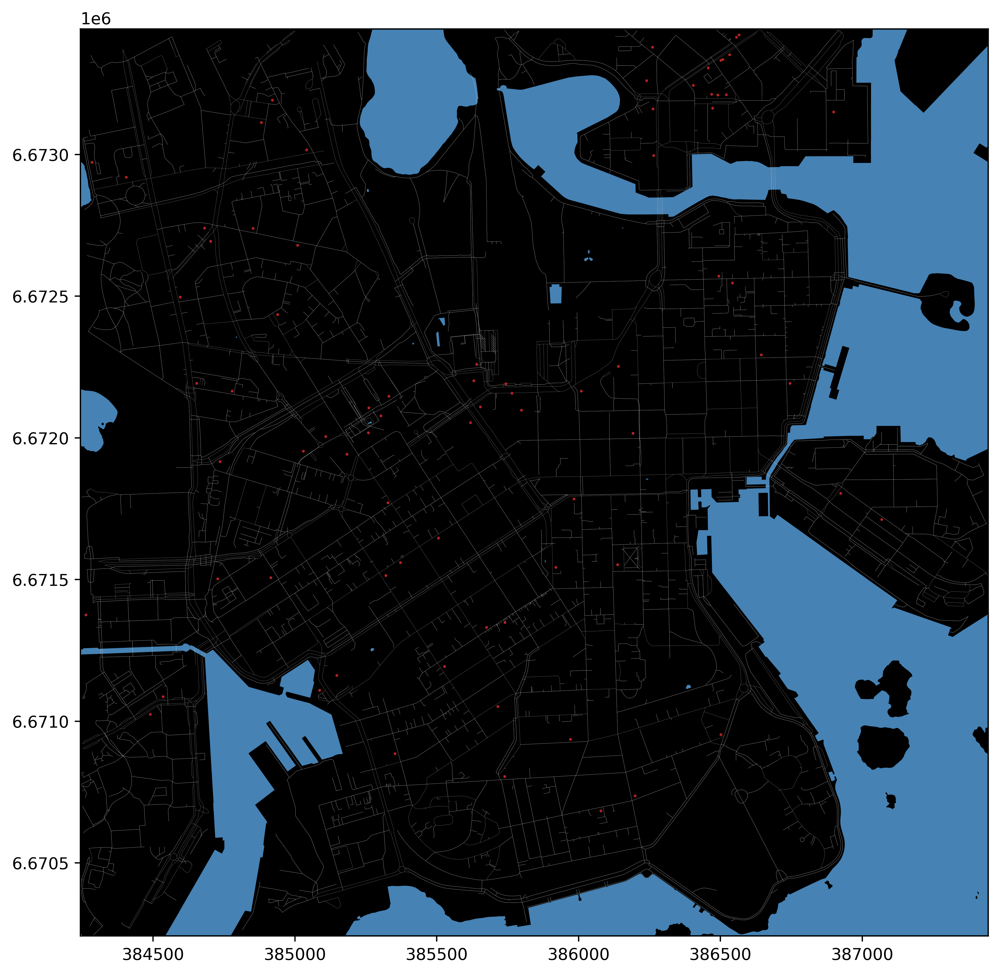

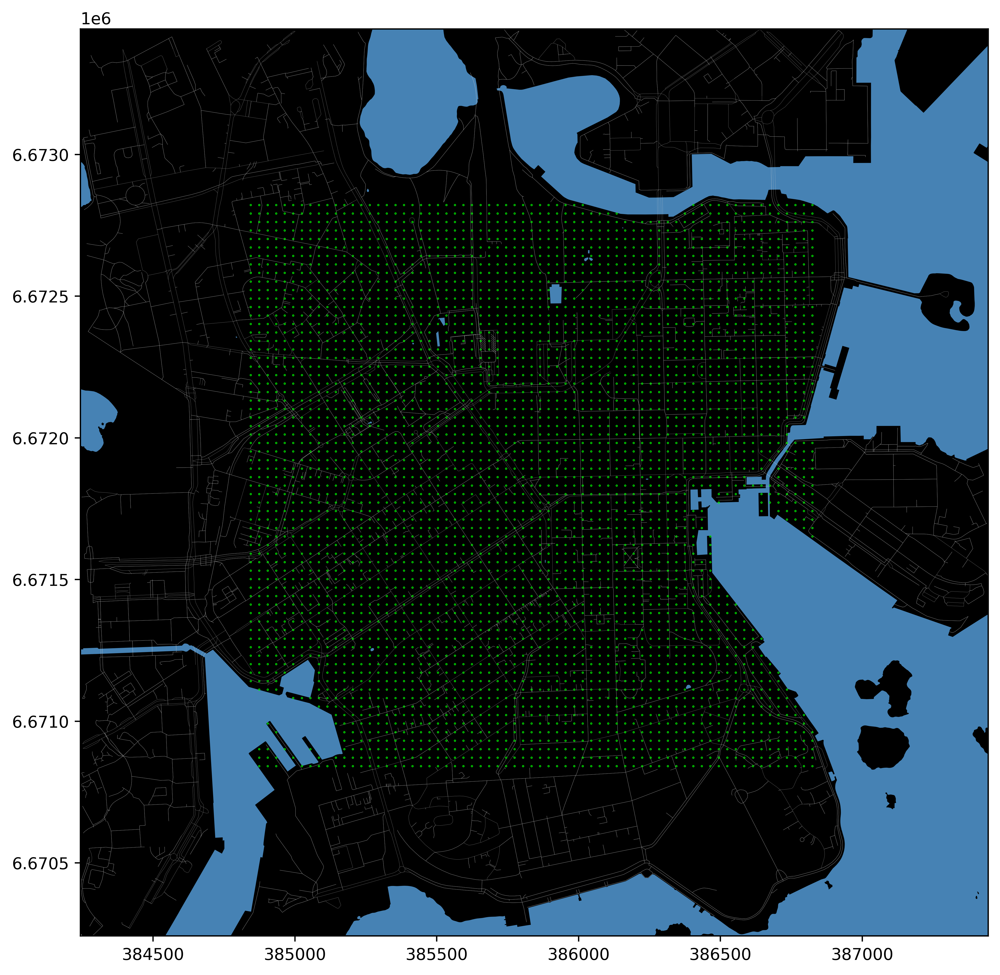

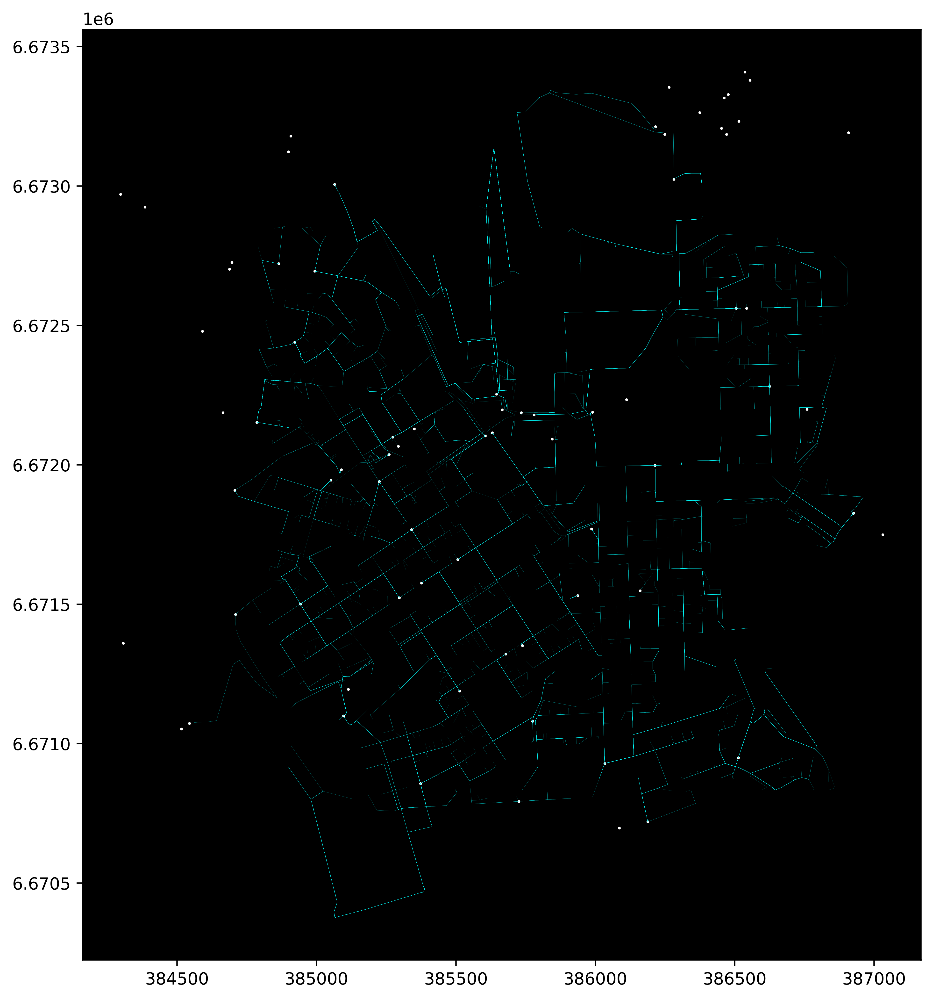

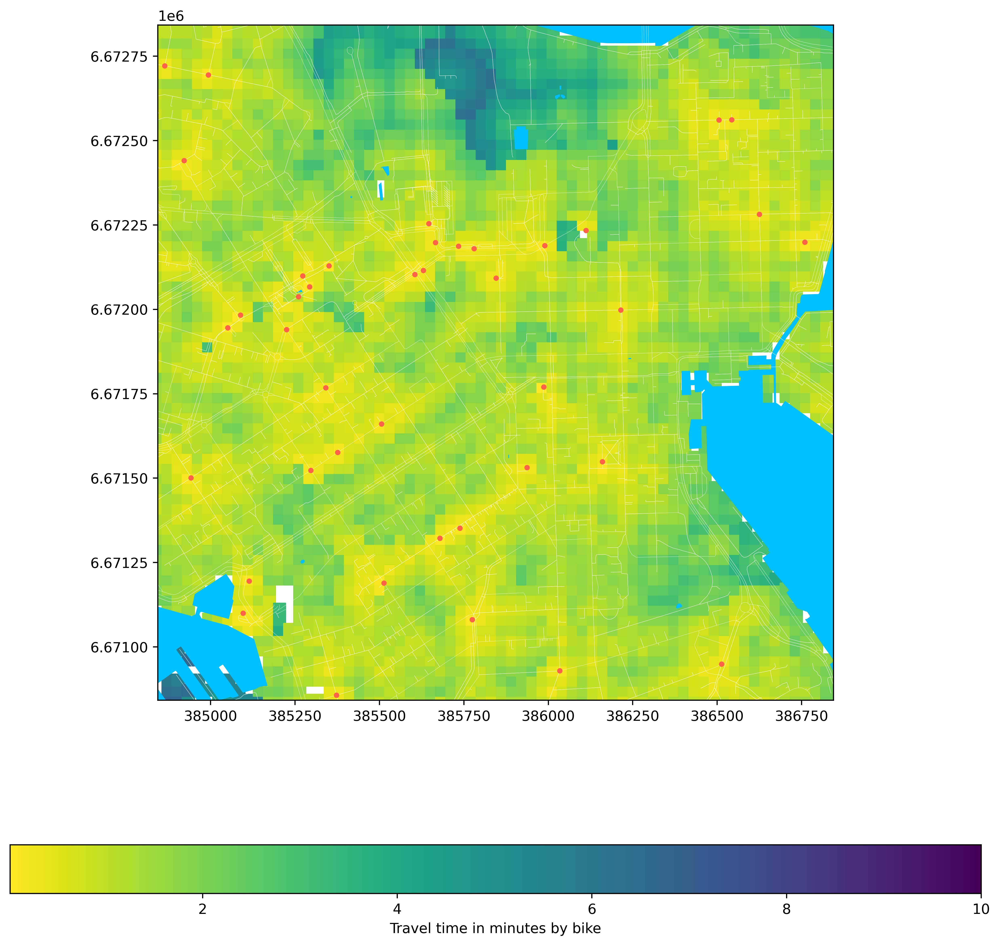

In [40]:

for i in range(len(cities)):
    loop_start = perf_counter()
    print(f"Processing {cities.at[i, 'name']}")
    cities.at[i, 'median_grocer_t_min'] = city_grocer_accessibility(i, cities, buffer_size,
                              overbuffering, grid_spacing, k_closest,
                              walking_speed, biking_speed, buffer_style,
                              bboxs_mc, bboxs, sea_path=sea_path)
    
    loop_end = perf_counter()
    print(f"Processed {cities.at[i, 'name']} in {pretty_time(loop_end-loop_start)}")
cities